<a href="https://colab.research.google.com/github/danielsoy/ALOCC-CVPR2018/blob/master/sin_segmetacion_central_six_botellas_mvtec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UNSUPERVISED ANOMALY SEGMENTATION
### This is a implementation of **DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation** https://arxiv.org/abs/2012.07122
#### We train only with OK images, and then we predict a hotmap, where high areas are presumably anomalous
#### The pretrained weights provided by me (input anomalysegmentation-weights) are not very good because Kaggle limits training time to 9hrs

CAMBIAR DOS PATH HACIA EL DATASET, RAIZ(SCREW X EJEMPLO), Y TEST. EN DRIVE, AGRUPAR TODOS LOS DEFECTOS, EN LA CARPETA MAL.
Y CAMBIAR EL NOMBRE DE GOOD A BIEN.
cOLOCAR  1 EPOCH PARA PROBAR SI LLEGA LA NOTEBOOK AL FINAL. 

## IMPORTS

In [1]:
!pip install tqdm

In [2]:
import tensorflow as tf  
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from skimage import io
from skimage.transform import resize

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import cv2

import random
import os
from tqdm import tqdm

from random import randrange

In [3]:
from google.colab import drive

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


## Custom Data Generator

In [78]:
class CustomDataGen(tf.keras.utils.Sequence):    #/content/drive/MyDrive/screw/test
    
    def __init__(self, path = "/content/drive/MyDrive/six botellas",# aca dir raiz del dataset, este caso:screw
                  batch_size = 1,
                 input_size=(224, 224),
                 shuffle=True, seed = None, subset = 'training'):
        
        self.image_data_generator = ImageDataGenerator(rescale=1. / 255, data_format='channels_last',     
            #zoom_range = 0.1,
            #width_shift_range = 0.05,
            #height_shift_range = 0.05,
            #brightness_range=(0.95,1.05)
        )
        
        if seed is None:
            random.randint(0, 2**32)
            
        self.batch_size = batch_size
        self.input_size = input_size
        
        self.X_paths = [os.fsdecode(file) for file in os.scandir(f"{path}/train/good")]
        self.X_train, self.X_val = train_test_split(self.X_paths, test_size=0.2, random_state = seed, shuffle = True)
        
        if subset == 'training':            
            self.X = self.X_train
        elif subset == 'validation':
            self.X = self.X_val
            
        self.n = len(self.X)
    
    
    def __getitem__(self, index):
        
        data_x = []
        
        for i in range(self.batch_size):
            image = cv2.imread(self.X[self.batch_size * index + i])
            
            image = self.image_data_generator.random_transform(image)
            
            image = image / 255
            
            image = tf.image.resize(image, self.input_size)
            data_x.append(image)
            
        data_x = np.array(data_x)
        
        return data_x, data_x
    
    def __len__(self):            
        return self.n // self.batch_size

In [79]:
INPUT_SIZE = (224,224)
seed = random.randint(0, 2**32)
train_datagen = CustomDataGen(input_size = INPUT_SIZE, batch_size = 1, seed = seed)
validation_datagen = CustomDataGen(input_size = INPUT_SIZE, subset = "validation", seed = seed) 
#/content/drive/MyDrive/SCREW/train/good

In [80]:
#Check we dont have the same images in train and validation sets
any([value in train_datagen.X for value in validation_datagen.X])

False

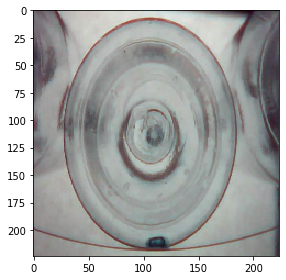

In [81]:
x, y = train_datagen[0]
io.imshow(x[0])
io.show()

## Model

In [82]:
input_model_filepath = "../input/anomalysegmentation-weights/anomaly-segmentation-model_vgg19.h5"
output_model_filepath = "./anomaly-segmentation-model.h5"
#model class
#Implementation of DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation https://arxiv.org/abs/2012.07122
class AnomalySegmentator(tf.keras.Model):
    def __init__(self, init_layer = 0, end_layer = None):
        super(AnomalySegmentator, self).__init__()
        #self.L2_weight = 1e-6
        self.init_layer = init_layer
        self.end_layer = end_layer
        
    def build_autoencoder(self, c0, cd):
        self.autoencoder = Sequential([
            layers.InputLayer((self.map_shape[0]//4, self.map_shape[1]//4, c0)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(cd,(1,1), padding='same'),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(c0,(1,1), padding='same')            
            
        ])
        
    def build(self, input_shape):
        
   ##   self.vgg = VGG19(include_top = False, weights = None, input_shape=input_shape[1:])    # original 
        self.vgg = VGG19(include_top = False, weights = 'imagenet', input_shape=input_shape[1:])  # weights=None, sin pesos


        self.features_list = [layer.output for layer in self.vgg.layers if 'conv' in layer.name][self.init_layer:self.end_layer]
        
        self.feature_extractor = Model(inputs = self.vgg.input, 
                                       outputs = self.features_list)
        self.feature_extractor.trainable = False   
        
        self.threshold = tf.Variable(0, trainable = False, dtype = tf.float32)

        self.map_shape = self.features_list[0].shape[1:-1]
        
        self.average_pooling = layers.AveragePooling2D(pool_size=(4, 4), strides=(4,4))       
        
        
        
        self.c0 = sum([feature.shape[-1] for feature in self.features_list])        
        self.cd = 40        
        self.build_autoencoder(self.c0, self.cd)
        
          
    def call(self, inputs):
        features = self.feature_extractor(inputs)
        resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
        resized_features = tf.concat(resized_features, axis = -1)
        
        resized_features = self.average_pooling(resized_features)

        autoencoder_output = self.autoencoder(resized_features)
        return tf.reduce_sum((autoencoder_output - resized_features)**2, axis = -1)
        
    def reconstruction_loss(self):
        @tf.function
        def _loss(y_true, y_pred):
            loss = tf.reduce_mean(y_pred, axis = (1,2)) / (tf.cast(tf.shape(y_pred)[0], tf.float32) * self.c0)
            return loss
                    
        return _loss

    def compute_threshold(self, data_loader, fpr = 0.05):
      error = []
      for i in tqdm(range(len(data_loader))):
        x, y = data_loader[i]
        error.append(self(x))

      threshold = np.percentile(error, 100 - fpr)
      self.threshold = tf.Variable(threshold, trainable = False, dtype = tf.float32)
        
    def compute_pca(self, data_loader):
        extraction_per_sample = 20
        
        extractions = []        
        for i in tqdm(range(len(data_loader))):
            x, _ = data_loader[i]     
            
            features = self.feature_extractor(x)
            resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
            resized_features = tf.concat(resized_features, axis = -1)

            resized_features = self.average_pooling(resized_features)
            
            for feature in resized_features:
                
                for _ in range(extraction_per_sample):                    
                
                    row, col = randrange(feature.shape[0]), randrange(feature.shape[1])
                    extraction = feature[row, col]
                    extractions.append(extraction)
            
        extractions = np.array(extractions)
        print(f"Extractions Shape: {extractions.shape}")
        pca = PCA(0.9, svd_solver = "full")
        pca.fit(extractions)
        self.cd = pca.n_components_
        self.build_autoencoder(self.c0, self.cd)
        print(f"Components with explainable variance 0.9 -> {self.cd}")
        
as_model = AnomalySegmentator()
as_model.compile(Adam(1e-4), loss = as_model.reconstruction_loss())

In [83]:
as_model.build((None, *INPUT_SIZE,3))
# aca falla si esta mal cambiado el weight = imagenet a None.


In [84]:
as_model.compute_pca(train_datagen)

100%|██████████| 106/106 [00:24<00:00,  4.29it/s]


Extractions Shape: (2120, 5504)
Components with explainable variance 0.9 -> 52


## Training

# TESTING

Epoch 1/3
106/106 [==============================] - 60s 558ms/step - loss: 19.9831 - val_loss: 9.4467 - lr: 1.0000e-04
Epoch 2/3
106/106 [==============================] - 59s 555ms/step - loss: 6.5774 - val_loss: 4.8727 - lr: 1.0000e-04
Epoch 3/3
106/106 [==============================] - 59s 556ms/step - loss: 4.0313 - val_loss: 3.5076 - lr: 1.0000e-04


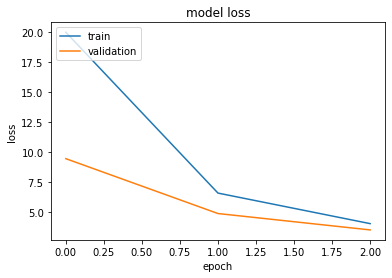

100%|██████████| 106/106 [00:26<00:00,  4.03it/s]


In [85]:
#True if we want to train the model
if True:
    # Training the model
    plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.5, patience=5, verbose = 1
    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                          patience=15)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint(output_model_filepath, monitor='val_loss', save_best_only=True,
                                                mode='min', save_weights_only = True)  # Saves the best version of the model to disk (as measured on the validation data set)
          
    history = as_model.fit(train_datagen,
        epochs=3,     ##%%%%%%%%%%%&&&&&&////////((((((((((((EPOCH EPOCH))))))))))))
        validation_data=validation_datagen,
        shuffle=True,
        callbacks=[es, save_best, plateau])
    #Training history
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    as_model.load_weights(output_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.save_weights(output_model_filepath)
else:
    
    as_model.build((None, *INPUT_SIZE,3))
    as_model.load_weights(input_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.summary()
    as_model.autoencoder.summary()

In [86]:
 classes = ['bien', 'mal', ] #folder bien va primero, no anomaly class. folder mal, contiene anomalias.
test_datagen = ImageDataGenerator(rescale=1. / 255, data_format='channels_last')
test_generator = test_datagen.flow_from_directory("/content/drive/MyDrive/six botellas/test", 
                                                  target_size = INPUT_SIZE,
                                                  batch_size = 1,
                                                  class_mode = 'sparse')

## /content/drive/MyDrive/screw/test 
## https://www.kaggle.com/danieldelro/anomalysegmention/data   provee model entrenado 9hs.anomaly-segmentation-model.h5

Found 41 images belonging to 2 classes.


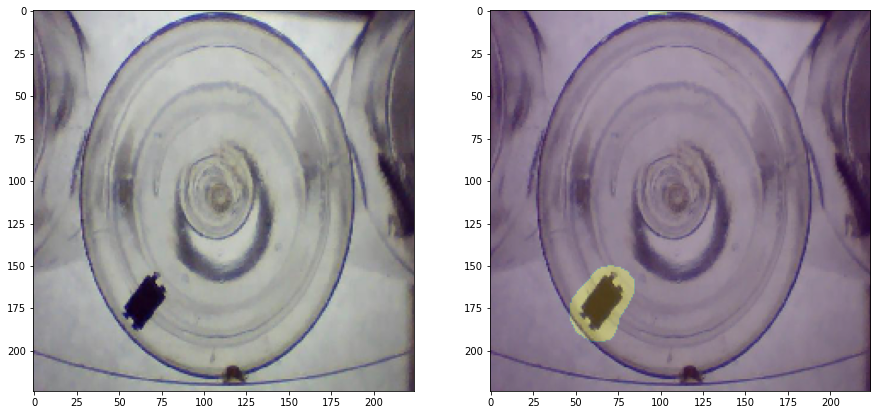

Threshold: 78371.78125 MaxValue: 174219.890625
GT: mal, anomaly detected: True


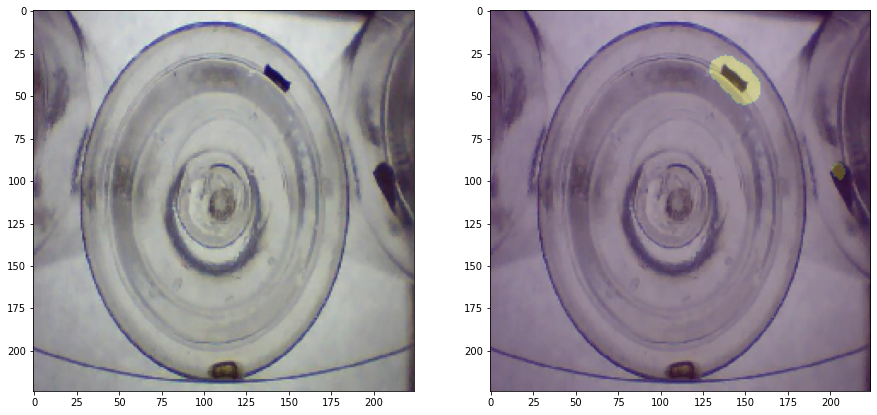

Threshold: 78371.78125 MaxValue: 178414.078125
GT: mal, anomaly detected: True


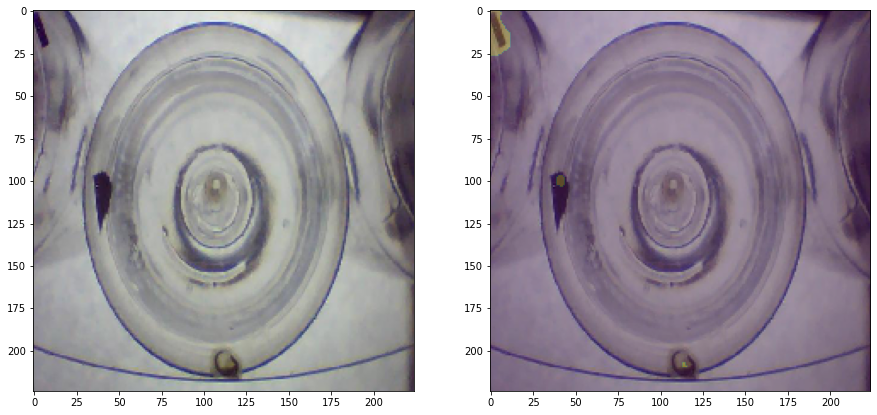

Threshold: 78371.78125 MaxValue: 141245.328125
GT: mal, anomaly detected: True


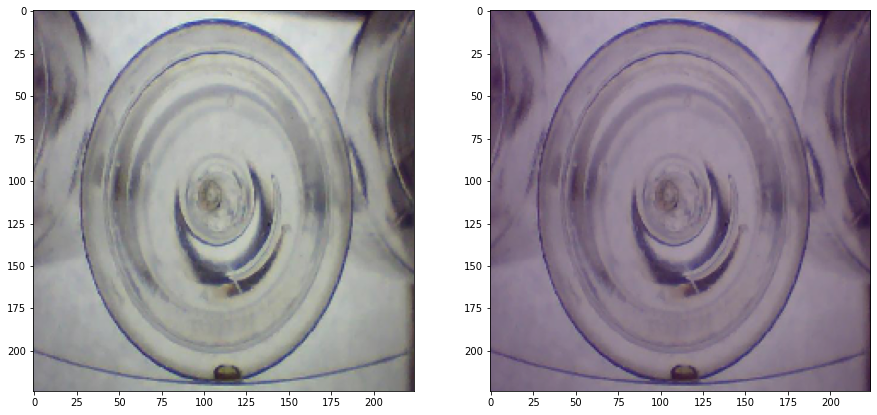

Threshold: 78371.78125 MaxValue: 68669.6015625
GT: bien, anomaly detected: False


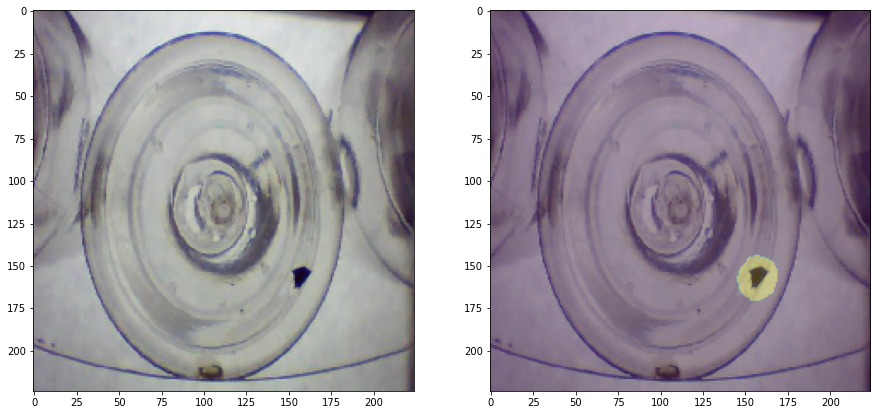

Threshold: 78371.78125 MaxValue: 198256.1875
GT: mal, anomaly detected: True


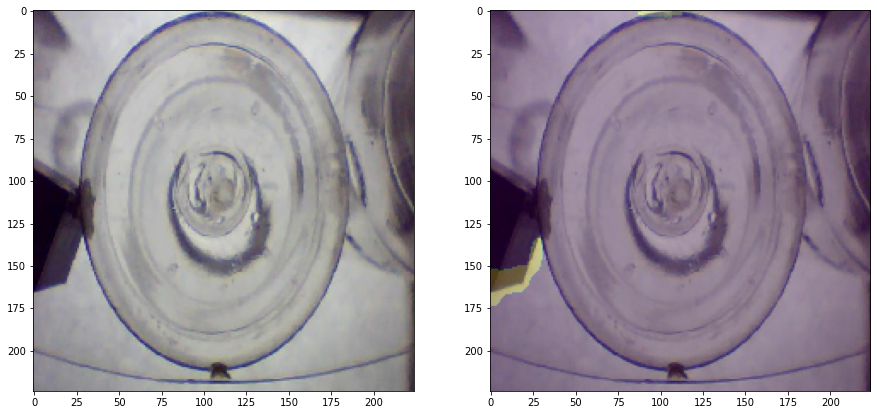

Threshold: 78371.78125 MaxValue: 136845.484375
GT: bien, anomaly detected: True


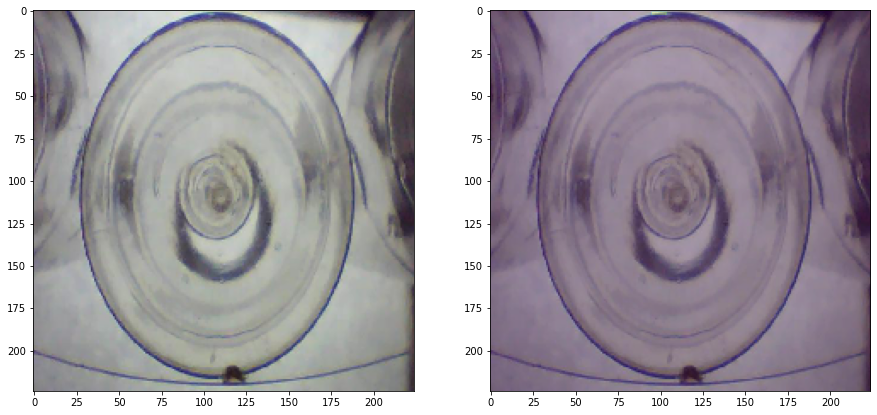

Threshold: 78371.78125 MaxValue: 80629.1796875
GT: bien, anomaly detected: True


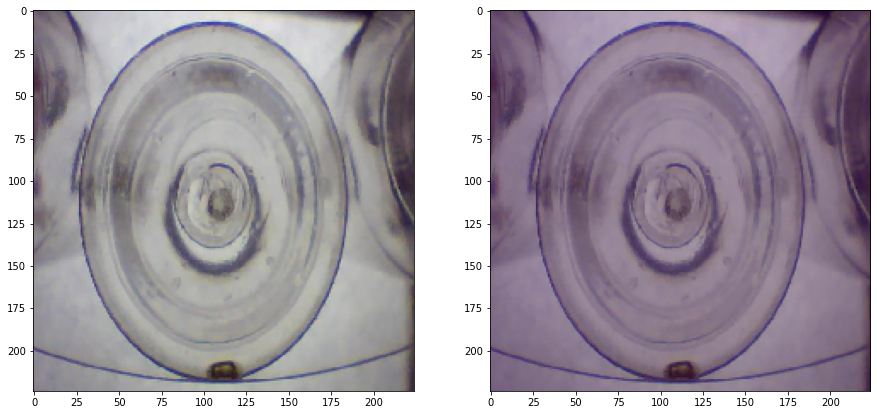

Threshold: 78371.78125 MaxValue: 74264.2265625
GT: bien, anomaly detected: False


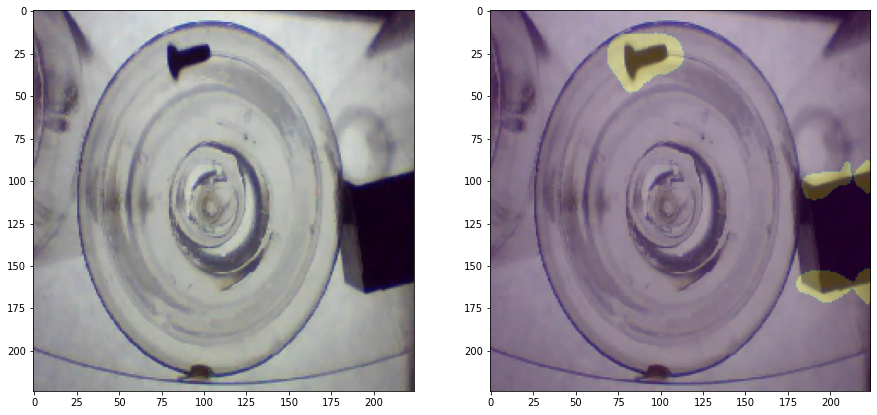

Threshold: 78371.78125 MaxValue: 167109.671875
GT: mal, anomaly detected: True


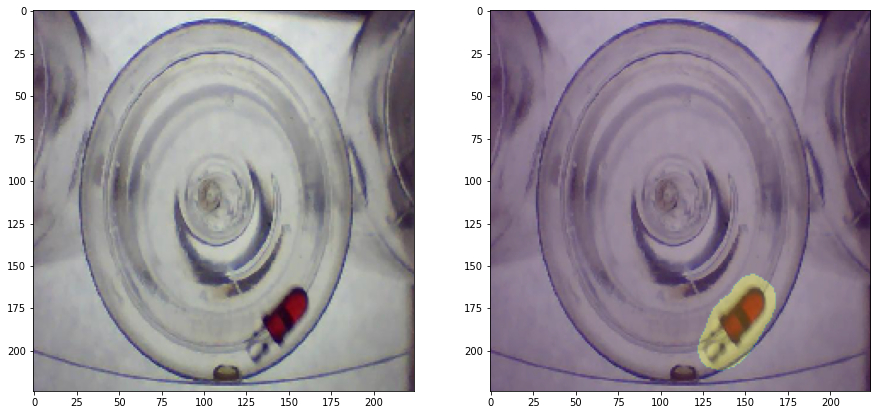

Threshold: 78371.78125 MaxValue: 219459.359375
GT: mal, anomaly detected: True


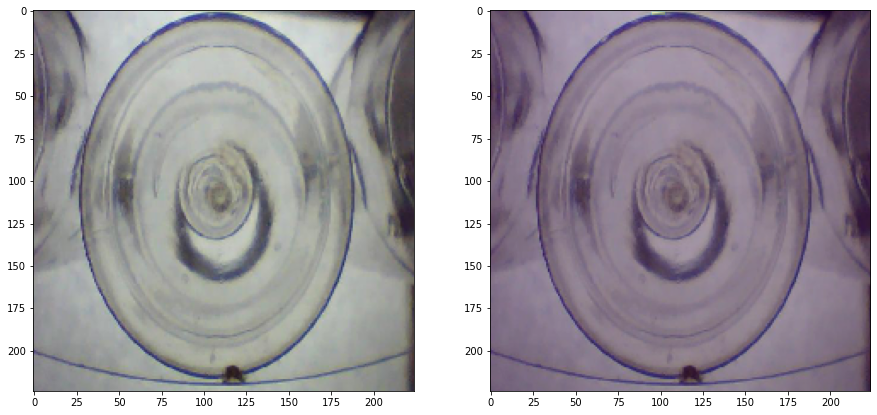

Threshold: 78371.78125 MaxValue: 79905.890625
GT: bien, anomaly detected: True


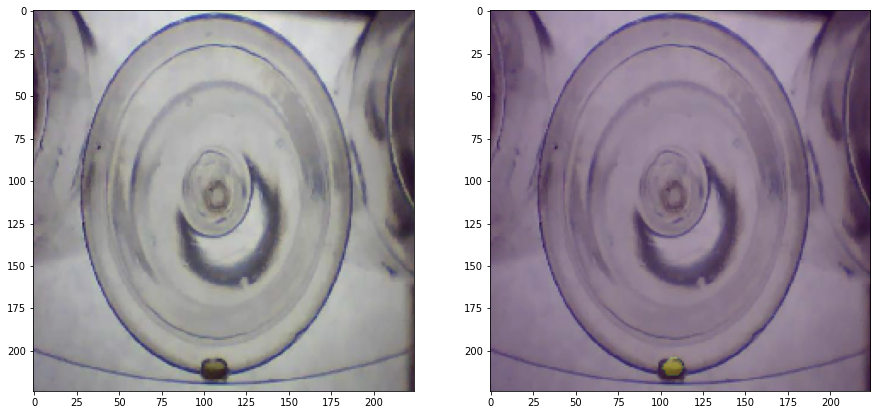

Threshold: 78371.78125 MaxValue: 94153.78125
GT: bien, anomaly detected: True


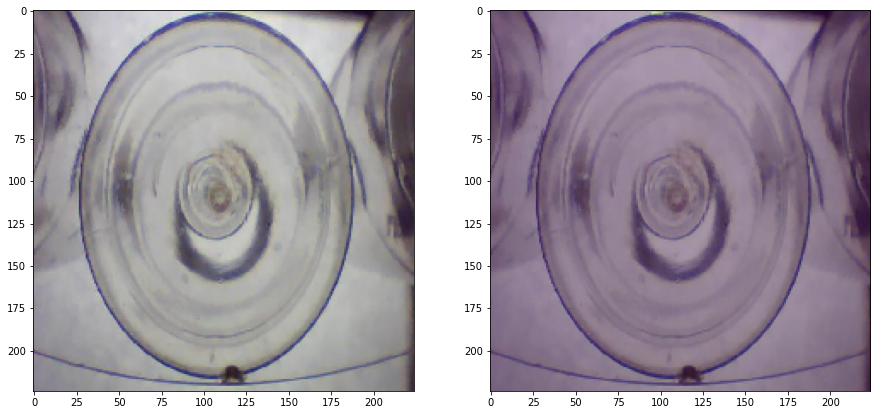

Threshold: 78371.78125 MaxValue: 79363.953125
GT: bien, anomaly detected: True


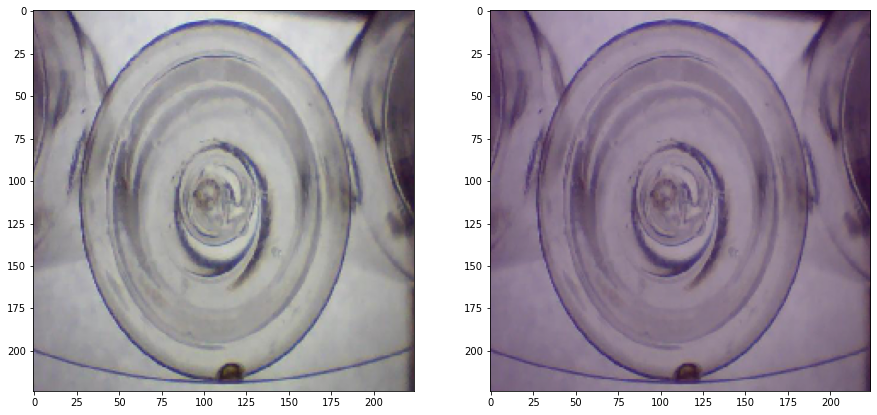

Threshold: 78371.78125 MaxValue: 77291.890625
GT: bien, anomaly detected: False


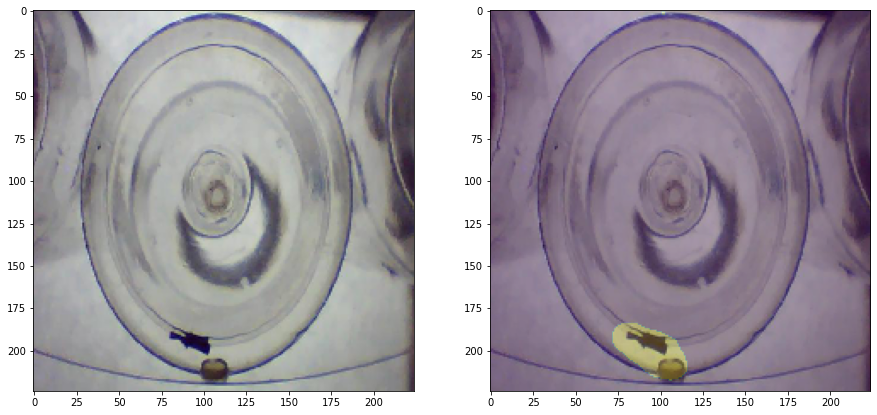

Threshold: 78371.78125 MaxValue: 168695.0
GT: mal, anomaly detected: True


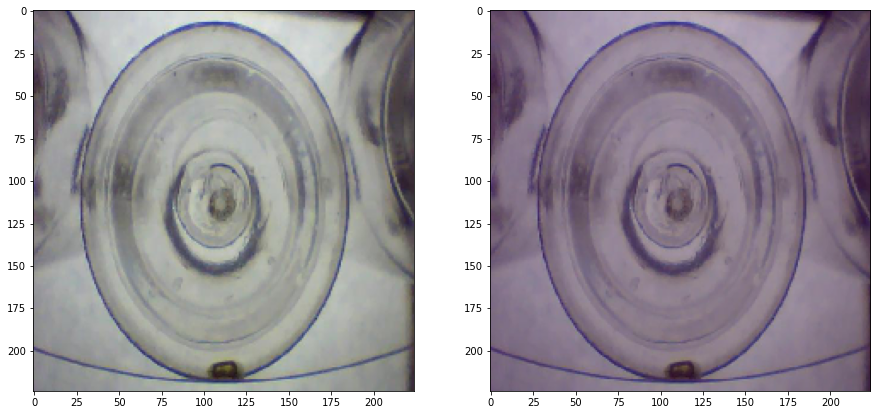

Threshold: 78371.78125 MaxValue: 72360.390625
GT: bien, anomaly detected: False


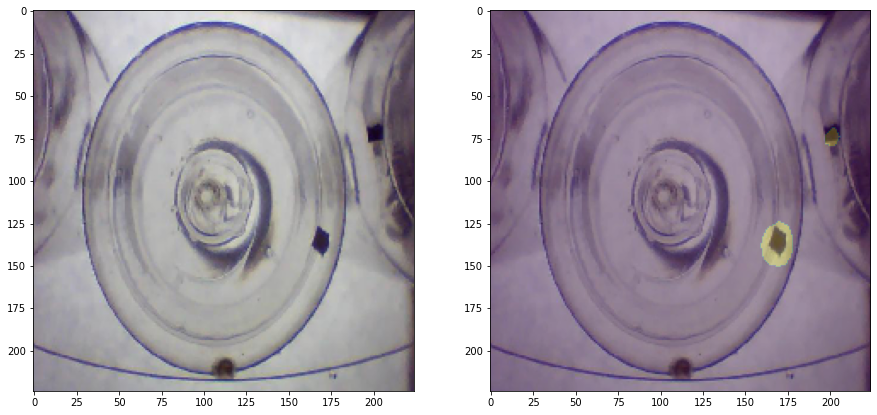

Threshold: 78371.78125 MaxValue: 162889.375
GT: mal, anomaly detected: True


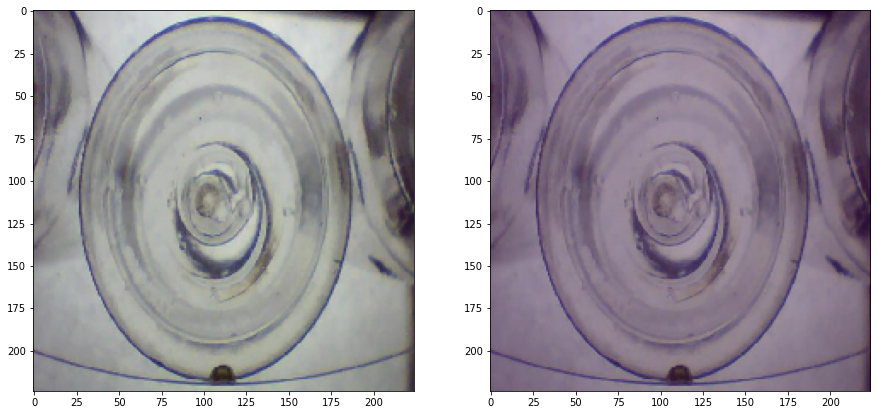

Threshold: 78371.78125 MaxValue: 69049.4921875
GT: bien, anomaly detected: False


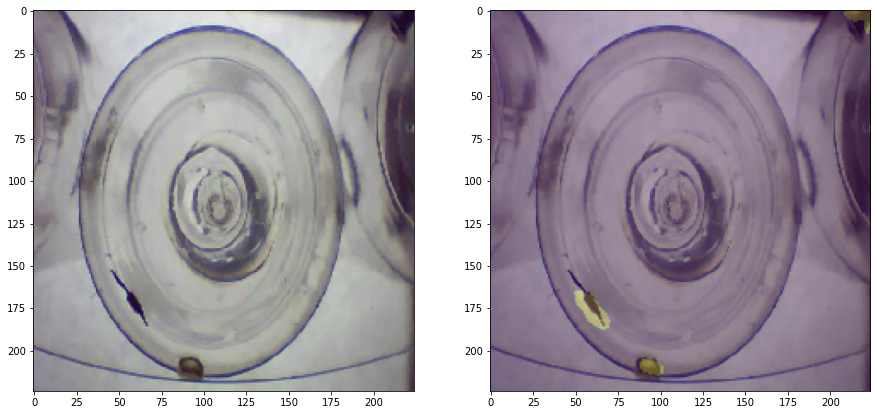

Threshold: 78371.78125 MaxValue: 102536.734375
GT: mal, anomaly detected: True


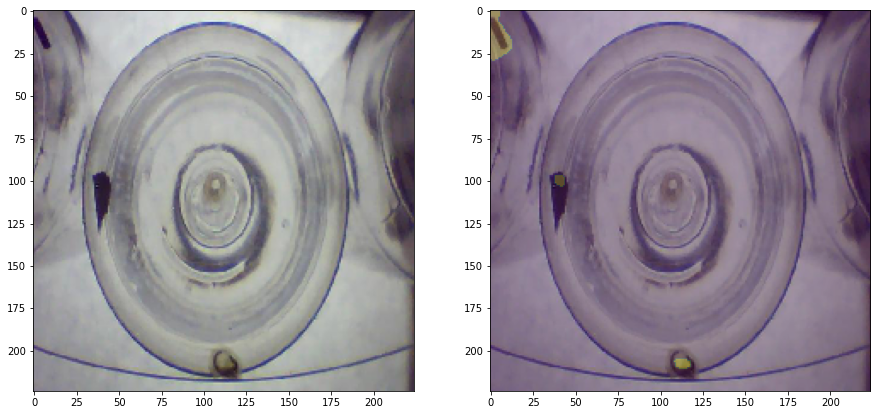

Threshold: 78371.78125 MaxValue: 140118.921875
GT: mal, anomaly detected: True


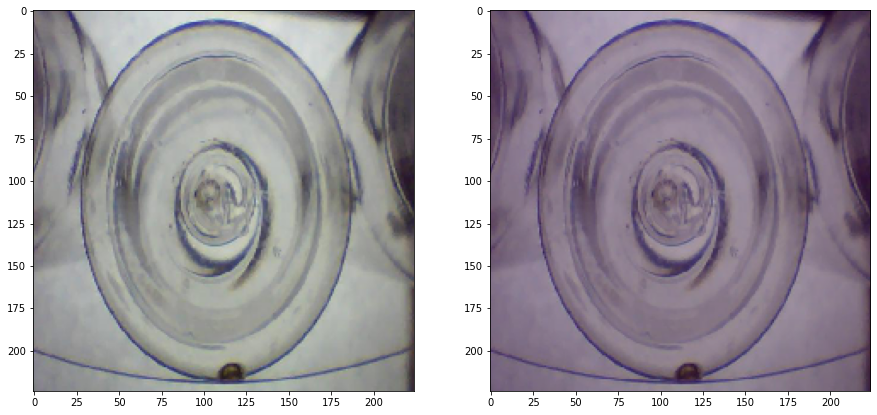

Threshold: 78371.78125 MaxValue: 75021.0703125
GT: bien, anomaly detected: False


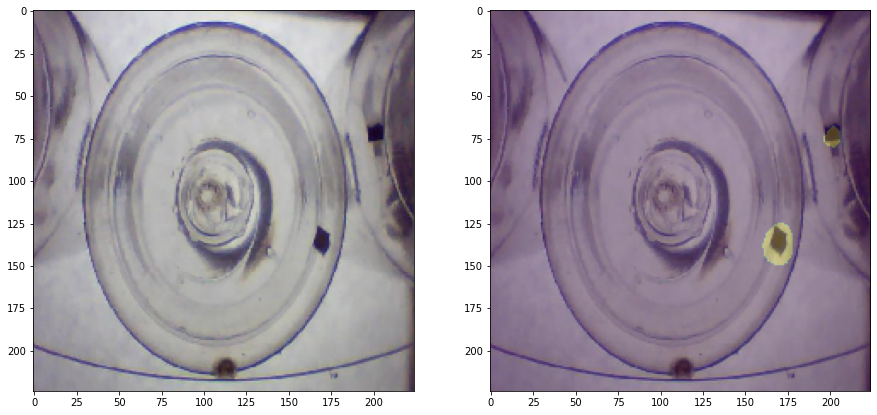

Threshold: 78371.78125 MaxValue: 157504.484375
GT: mal, anomaly detected: True


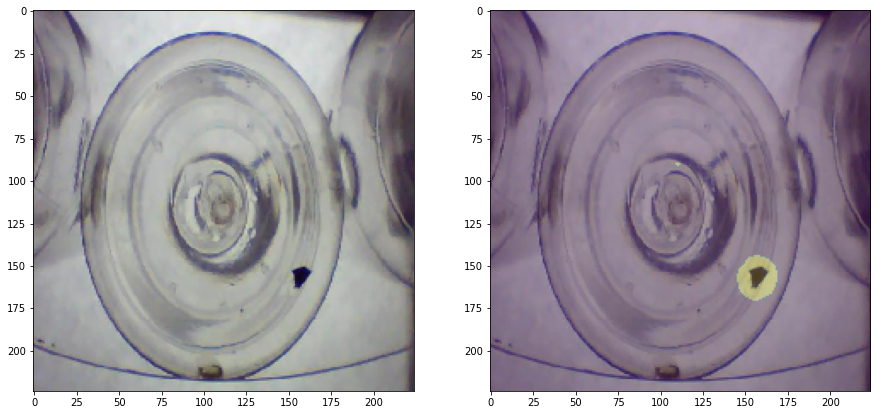

Threshold: 78371.78125 MaxValue: 196482.296875
GT: mal, anomaly detected: True


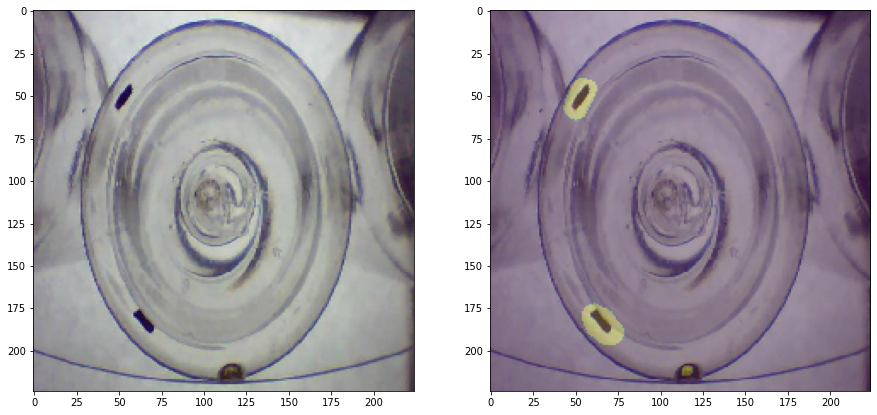

Threshold: 78371.78125 MaxValue: 178363.984375
GT: mal, anomaly detected: True


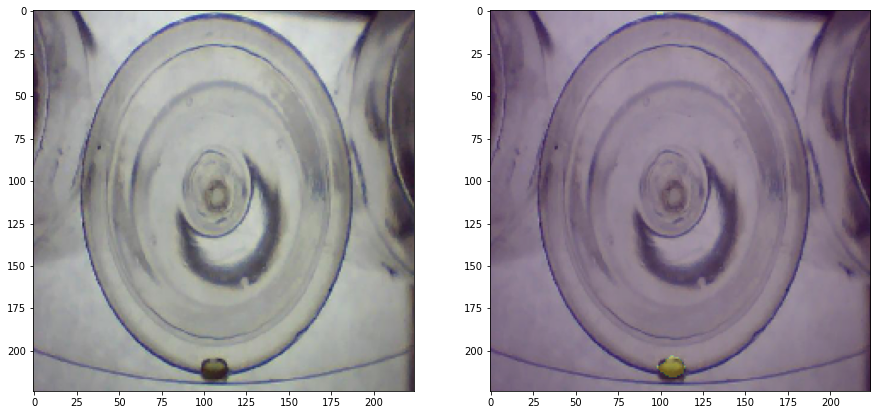

Threshold: 78371.78125 MaxValue: 98381.3046875
GT: bien, anomaly detected: True


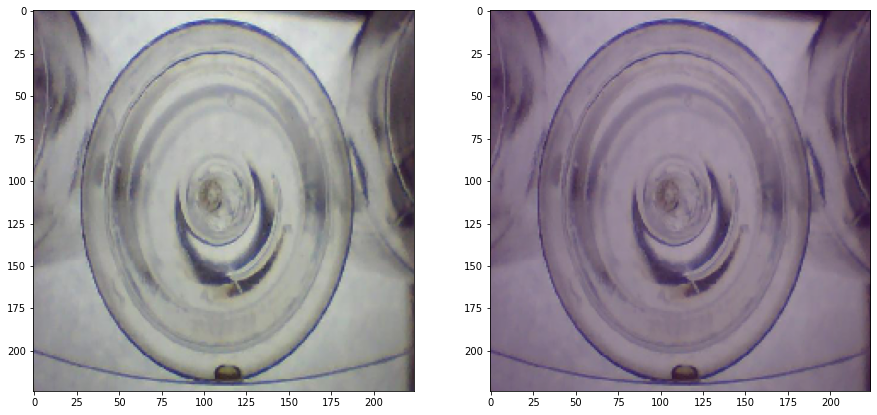

Threshold: 78371.78125 MaxValue: 72471.703125
GT: bien, anomaly detected: False


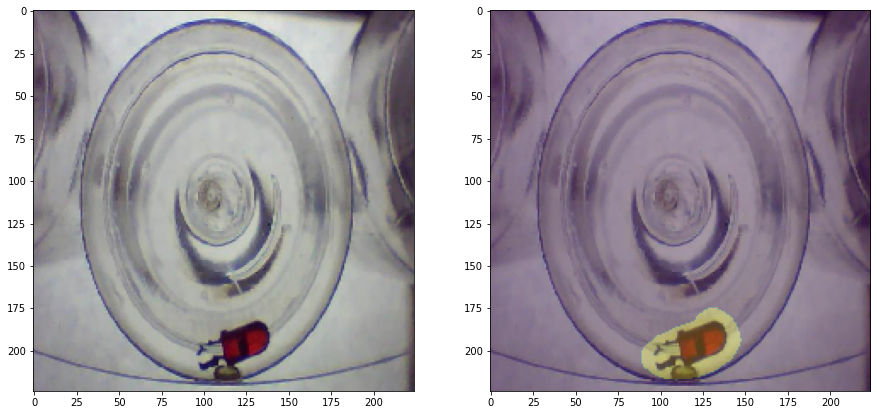

Threshold: 78371.78125 MaxValue: 235450.640625
GT: mal, anomaly detected: True


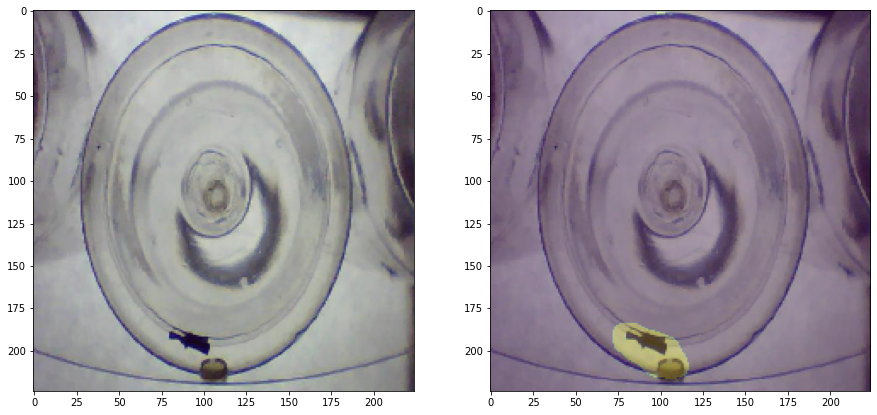

Threshold: 78371.78125 MaxValue: 171691.46875
GT: mal, anomaly detected: True


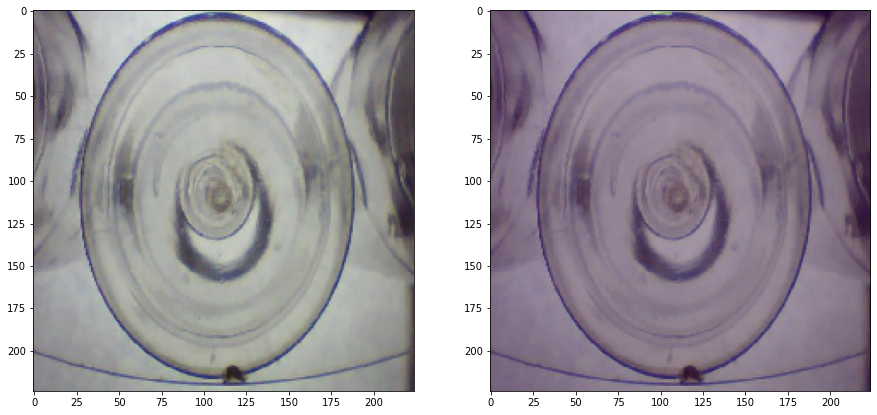

Threshold: 78371.78125 MaxValue: 80647.34375
GT: bien, anomaly detected: True


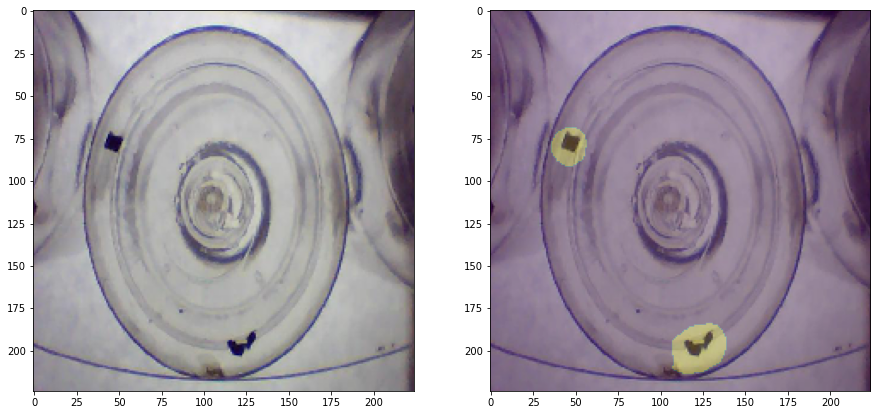

Threshold: 78371.78125 MaxValue: 189675.015625
GT: mal, anomaly detected: True


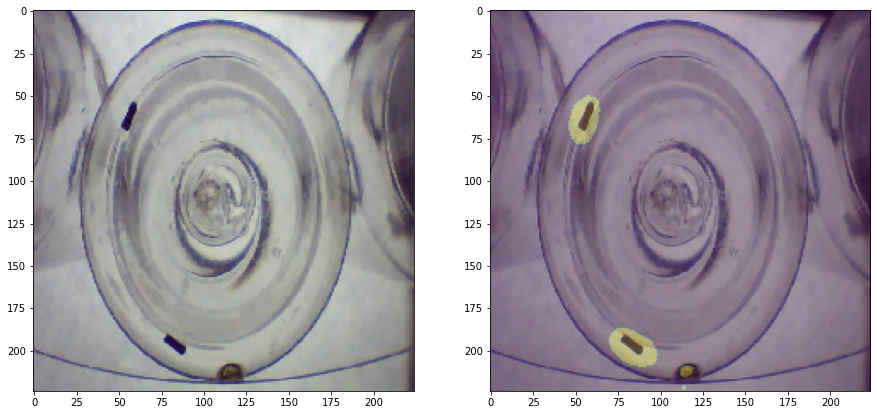

Threshold: 78371.78125 MaxValue: 166634.21875
GT: mal, anomaly detected: True


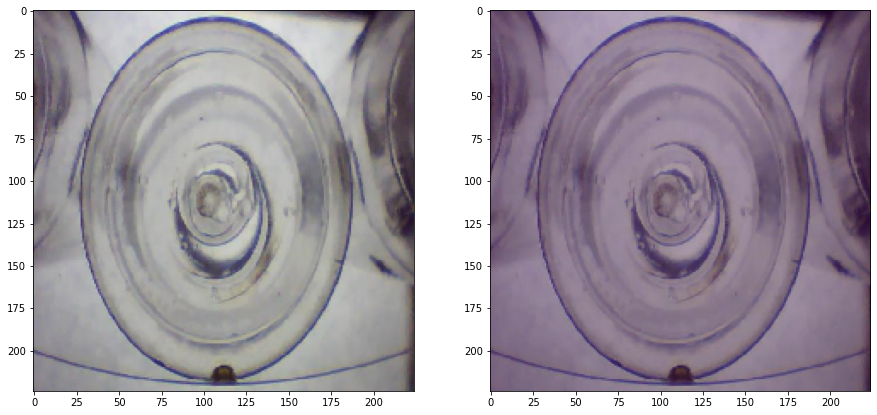

Threshold: 78371.78125 MaxValue: 73236.125
GT: bien, anomaly detected: False


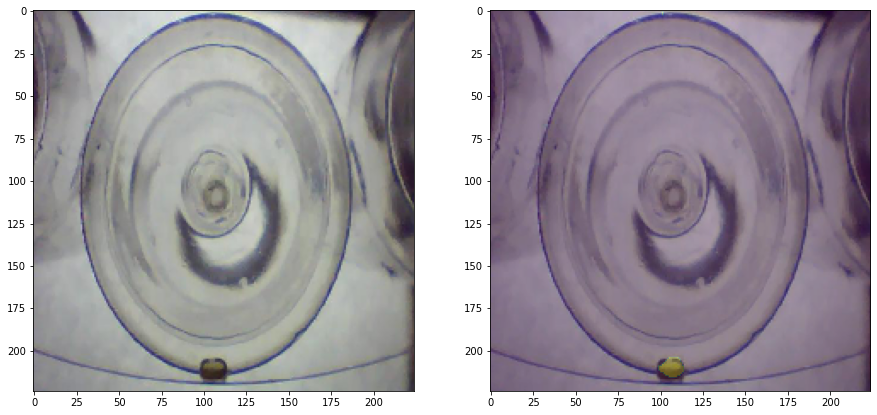

Threshold: 78371.78125 MaxValue: 98586.5703125
GT: bien, anomaly detected: True


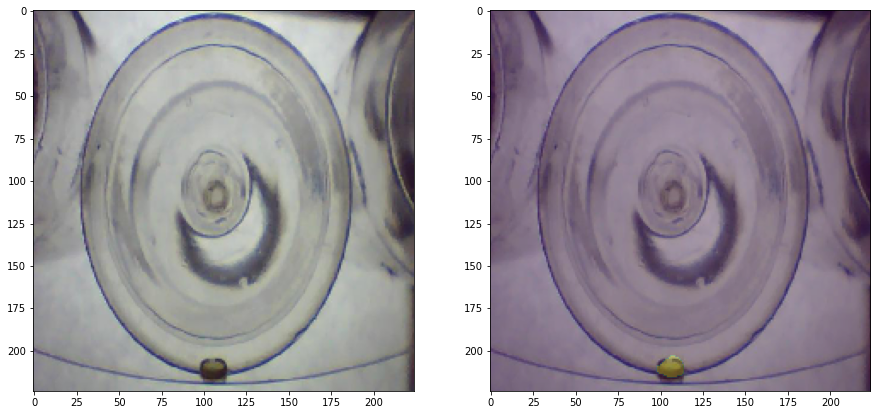

Threshold: 78371.78125 MaxValue: 99673.234375
GT: bien, anomaly detected: True


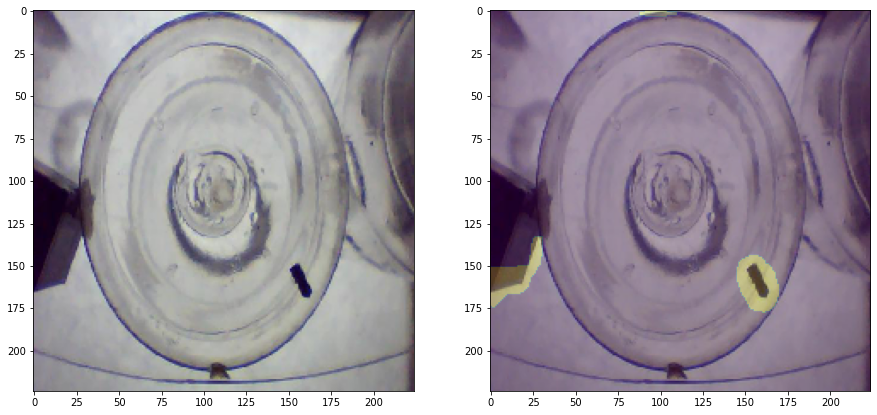

Threshold: 78371.78125 MaxValue: 177606.703125
GT: mal, anomaly detected: True


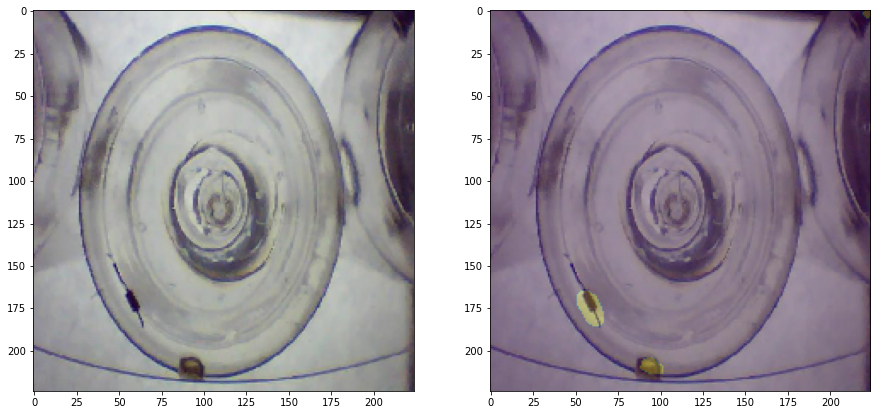

Threshold: 78371.78125 MaxValue: 124085.2109375
GT: mal, anomaly detected: True


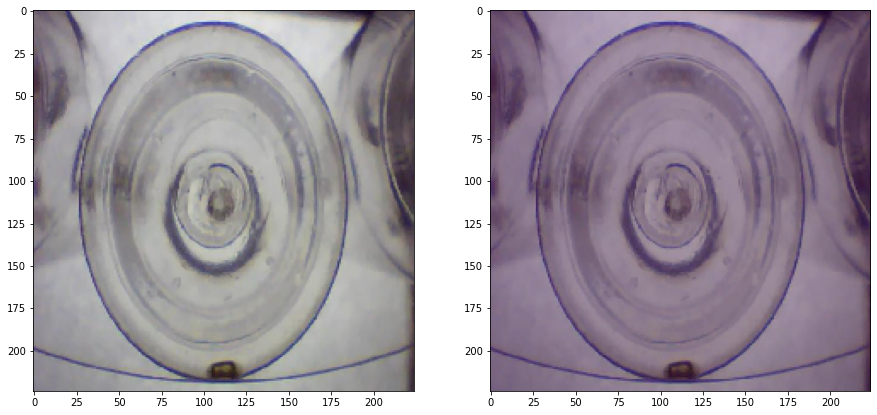

Threshold: 78371.78125 MaxValue: 74563.3828125
GT: bien, anomaly detected: False


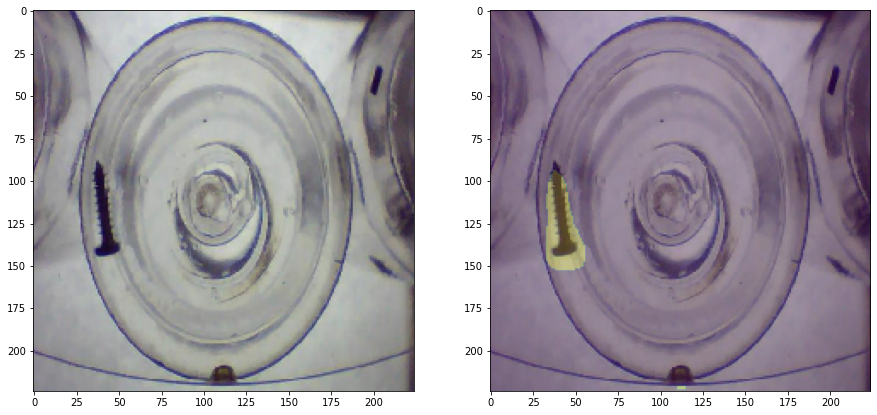

Threshold: 78371.78125 MaxValue: 141564.140625
GT: mal, anomaly detected: True


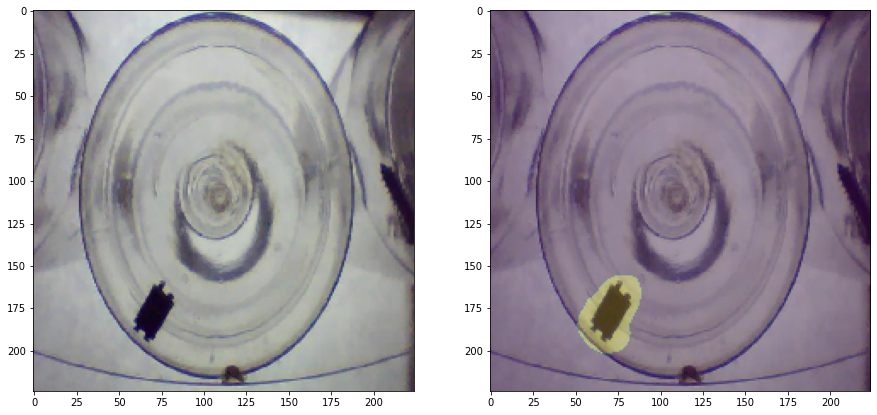

Threshold: 78371.78125 MaxValue: 184216.71875
GT: mal, anomaly detected: True


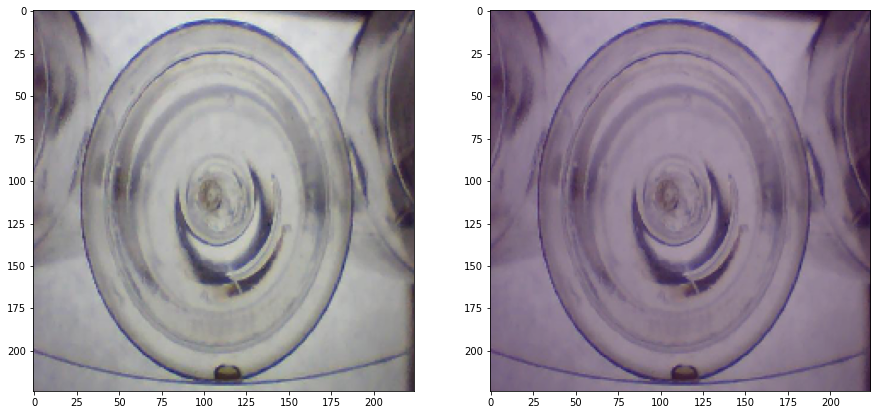

Threshold: 78371.78125 MaxValue: 72381.8046875
GT: bien, anomaly detected: False


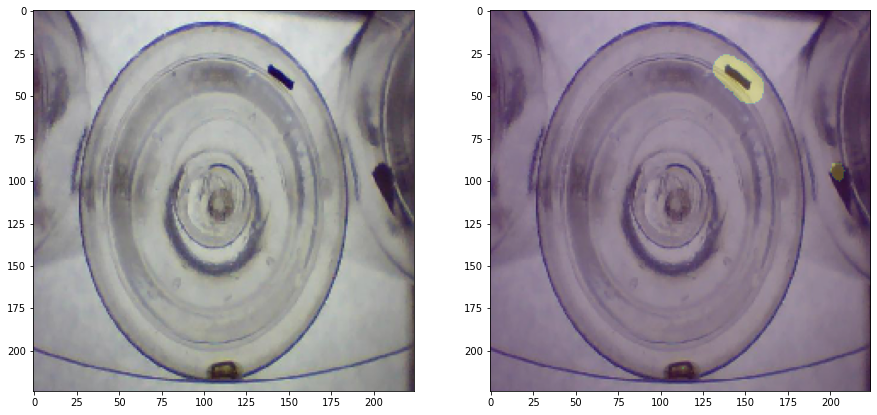

Threshold: 78371.78125 MaxValue: 170827.546875
GT: mal, anomaly detected: True


In [87]:
for i in range(41):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

        prediction = np.any(hotmap > as_model.threshold)

        hotmap = resize(hotmap, x.shape[:-1], anti_aliasing = True)
        mask = np.where(hotmap > as_model.threshold, 1, 0)
        

        f, axarr = plt.subplots(1,2, figsize=(15,15))
        axarr[0].imshow(x)
        axarr[1].imshow(mask)
        axarr[1].imshow(x, alpha = 0.75)
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
       
    

In [ ]:
for i in range(100):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

       

        prediction = np.any(hotmap > 0.25000) ## threshold elegido x mi
       #
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
    

AttributeError: ignored